In [1]:
import pathlib
import matplotlib as mpl
import pandas as pd
import scanpy as sc
import seaborn as sns

%matplotlib inline
from matplotlib import pyplot as plt
savefig_args = {
    "dpi": 300,
    "bbox_inches": "tight",
    "pad_inches": 0.2,
    "transparent": True,
}

mpl.rc("savefig", dpi=300)
output_dir = "../../figures/SI/batch_effects"

pathlib.Path(output_dir).mkdir(parents=True, exist_ok=True)
output_suffix = ""
output_formats = [".png", ".svg", ".pdf"]

def save_figure(
    fig,
    name,
    output_dir=output_dir,
    output_suffix=output_suffix,
    output_formats=output_formats,
    savefig_args=savefig_args,
):
    for output_format in output_formats:
        fig.savefig(
            output_dir + "/" + name + output_suffix + output_format, **savefig_args
        )
    return None

# Set Scanpy figure parameters
sc.set_figure_params(
    dpi_save=150, frameon=False,
    vector_friendly=True, fontsize=6, figsize=(3, 3),
    format='pdf', transparent=True
)

# Set Scanpy figure directory
sc.settings.figdir = output_dir

pd.set_option("display.max_rows", 50)
pd.set_option("display.max_columns", 20)
pd.set_option("display.width", 100)
%run ../../scripts/helper.py

# Set Seaborn style
sns.set_style("ticks")

# Use custom Matplotlib style
plt.style.use('../../scripts/bursa.mplstyle')


In [2]:
filename = "../../../data/all_cells.h5ad.gz"
adata = sc.read_h5ad(filename, backed='r+')

adata.obs['HT_library'] = adata.obs['sample_uid'].str.contains("HT")
adata.obs['data_from_this_study'] = adata.obs.sample_uid.str.contains('TBd')
adata.obs['frozen'] = adata.obs.sample_uid.str.contains('frozen')



# DownSample Full DataSet to ~40K cells

downsample the full dataset to 800 cells per sample (only using samples with more than 800 cells) 

In [3]:
# Calculate the size of each group with observed=True to adopt the future default and silence the warning
group_sizes = adata.obs.groupby("sample_uid", observed=True).size()
large_groups = group_sizes[group_sizes > 700].index

# Use the mask to filter adata.obs
filtered_data = adata.obs.loc[adata.obs['sample_uid'].isin(large_groups)].copy()

# Remove unused categories from the 'donor_tissue' column and ensure the data type is consistent
filtered_data['sample_uid'] = filtered_data['sample_uid'].astype('category')
filtered_data['sample_uid'] = filtered_data['sample_uid'].cat.remove_unused_categories()

# Now perform the groupby with observed=True and sample
sampled_data = filtered_data.groupby("sample_uid", observed=True).sample(n=700, replace=False)



In [4]:
# move subset data to memory
ad = adata[adata.obs.index.isin(sampled_data.index)].to_memory()

In [5]:
print(f"{ad.shape[0]} in the downsampled dataset")
## Define Technical Variables
# add technical variables to adata
#ad.obs['HT_library'] = ad.obs['sample_uid'].str.contains("HT")
#ad.obs['data_from_this_study'] = ad.obs.sample_uid.str.contains('TBd')
#ad.obs['frozen'] = ad.obs.sample_uid.str.contains('frozen')



57400 in the downsampled dataset


In [6]:
# define_technical_variables to plot on UMAP
technical_variables = ['n_genes', 'log1p_total_counts', 'data_from_this_study', 'HT_library', 'donor', 'tissue', 'frozen', "Immune_All_Low_predicted_labels", "Immune_All_High_predicted_labels"]
# highlight atypical B cells on the plot for illustrative purposes: 
ad.obs['is_ABC'] = ad.obs['Immune_All_Low_predicted_labels'] == "Age-associated B cells"



### UMAPs using PC space 

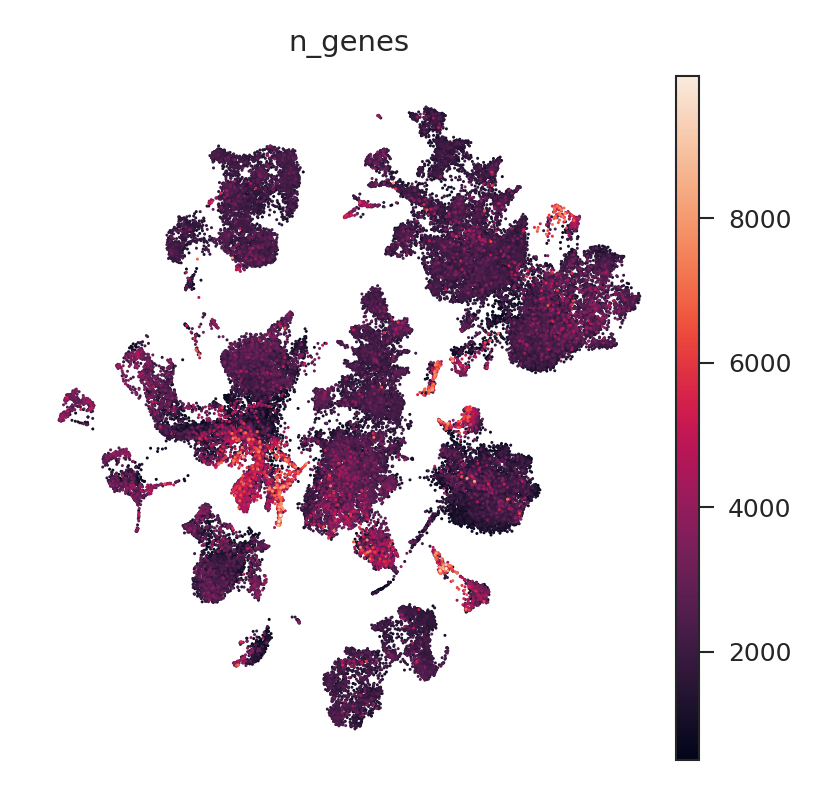

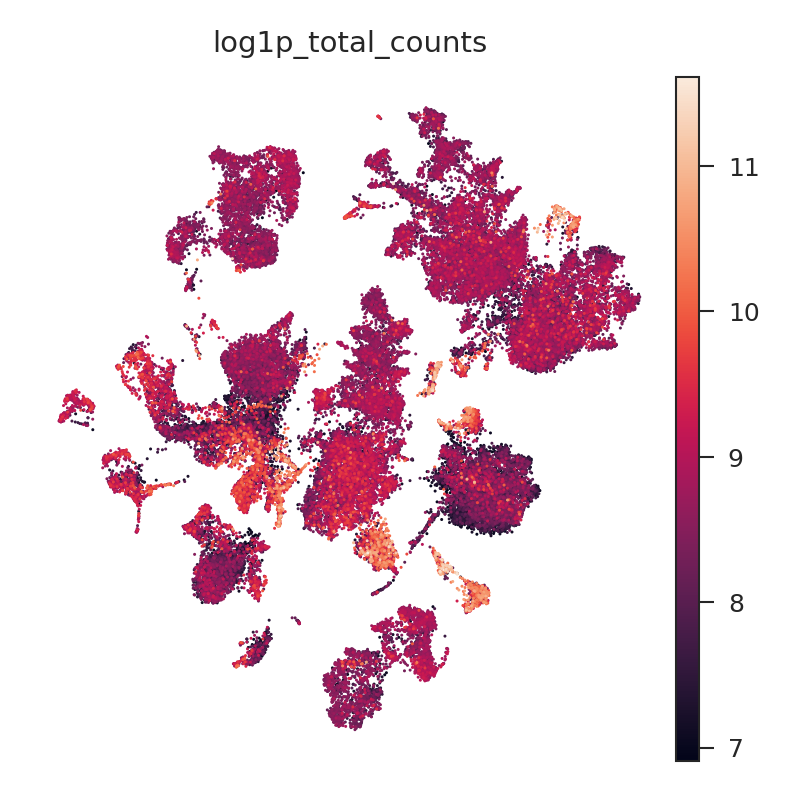

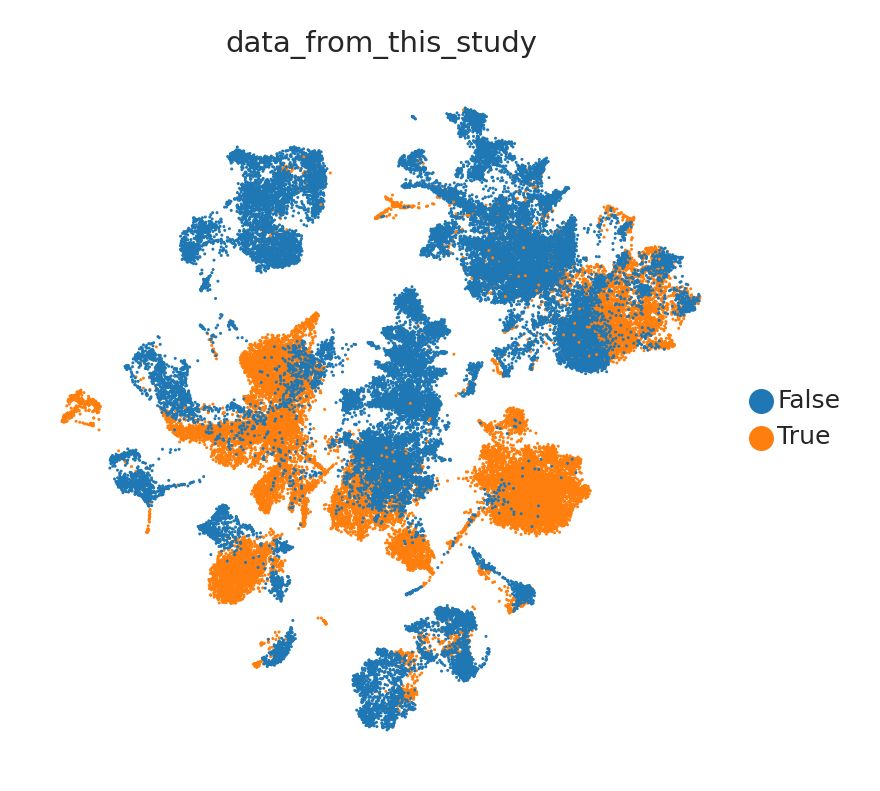

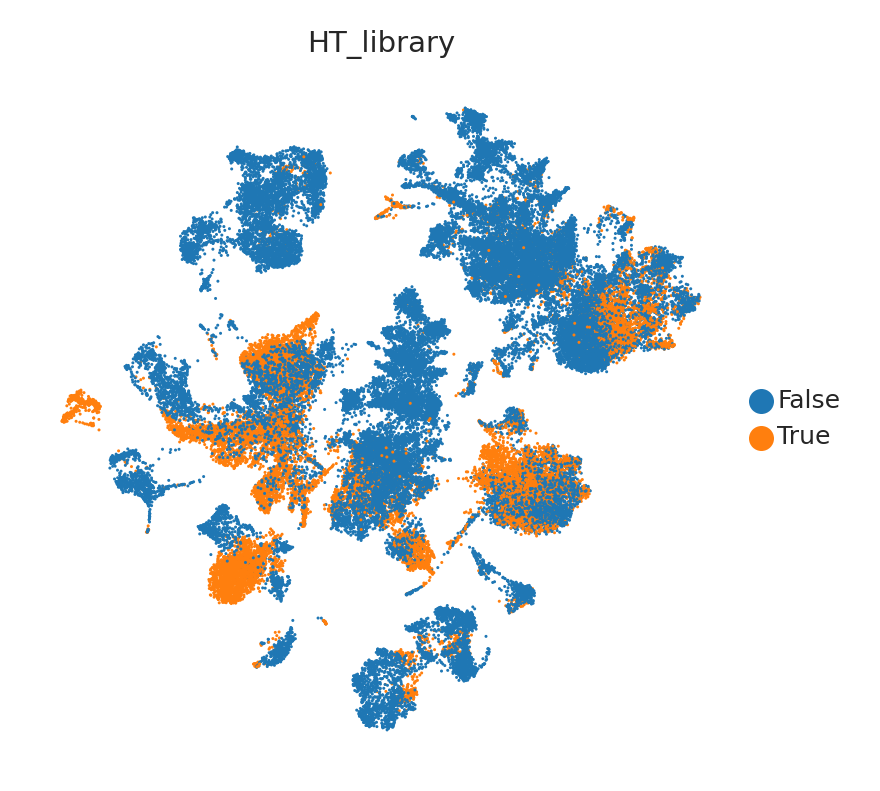

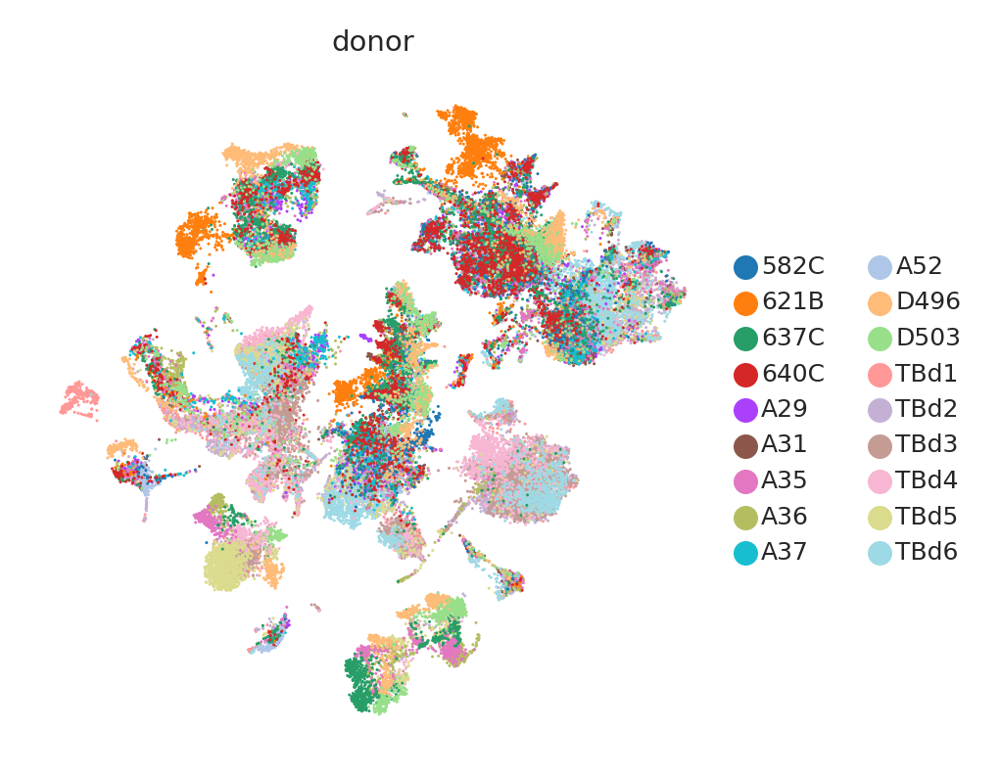

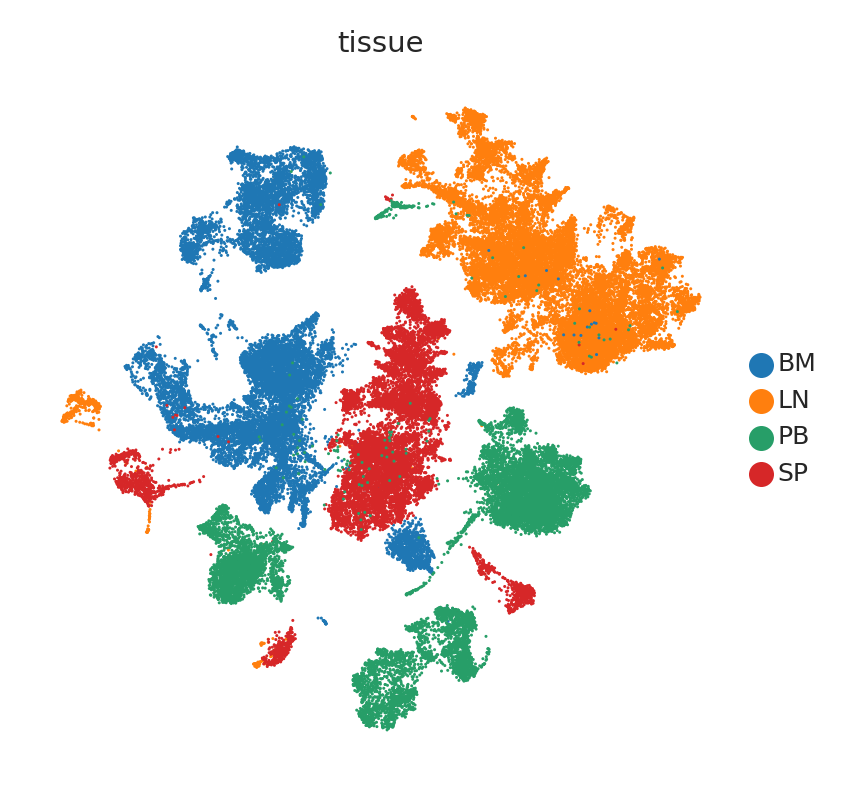

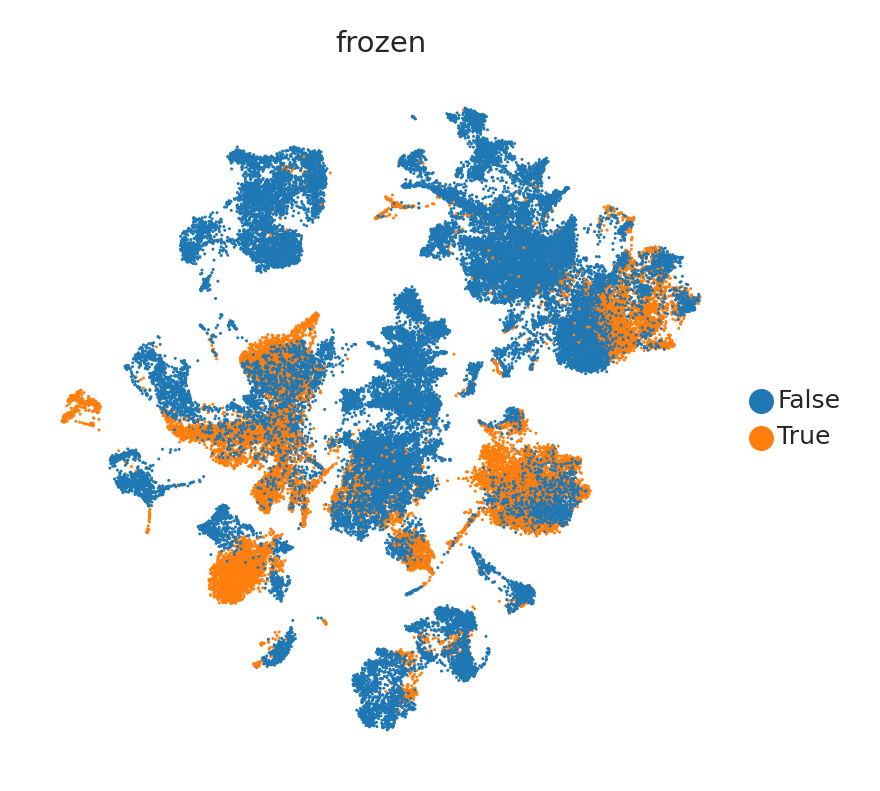

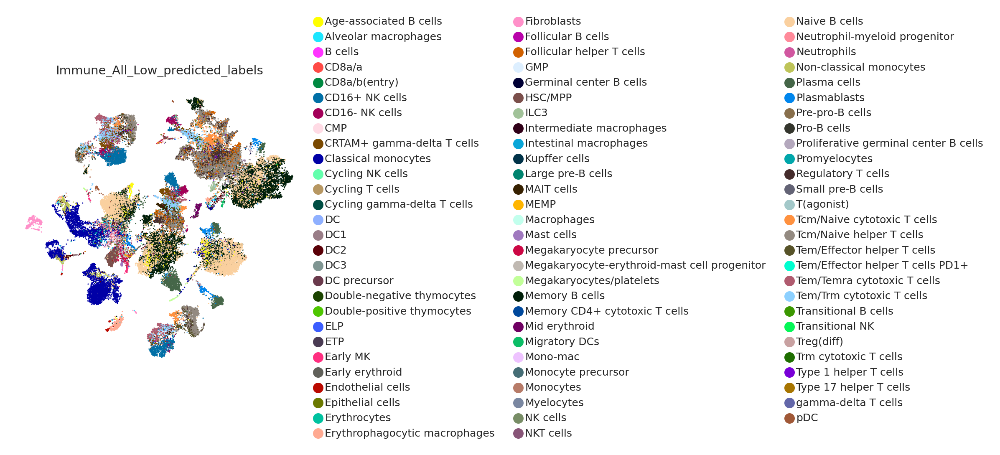

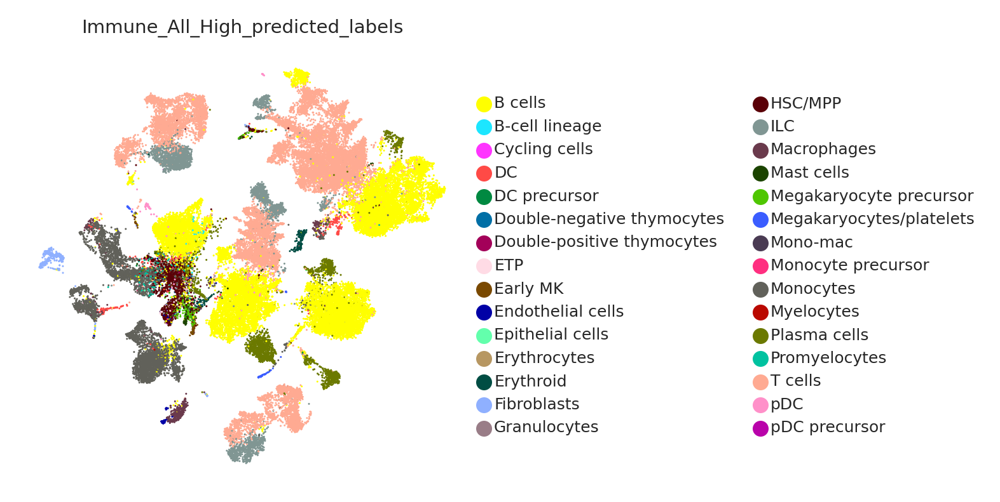

In [7]:
sc.pp.neighbors(ad)
sc.tl.umap(ad)
for tvar in technical_variables:
    sc.pl.umap(ad, color=tvar)

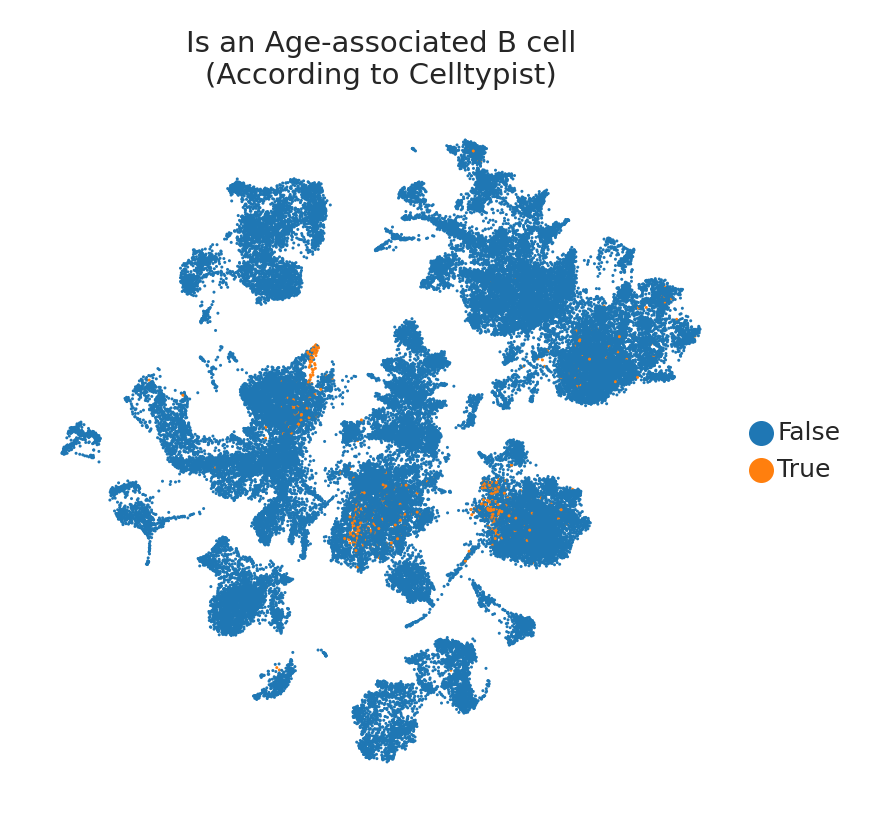

In [8]:
sc.pl.umap(ad, color="is_ABC", title="Is an Age-associated B cell\n(According to Celltypist)")

## Use the umap space

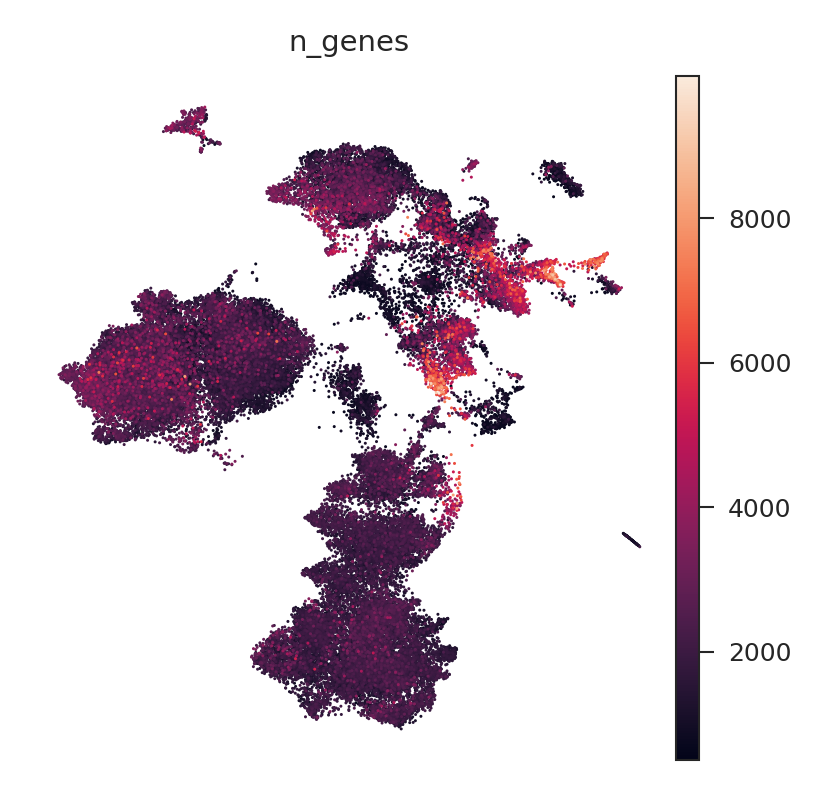

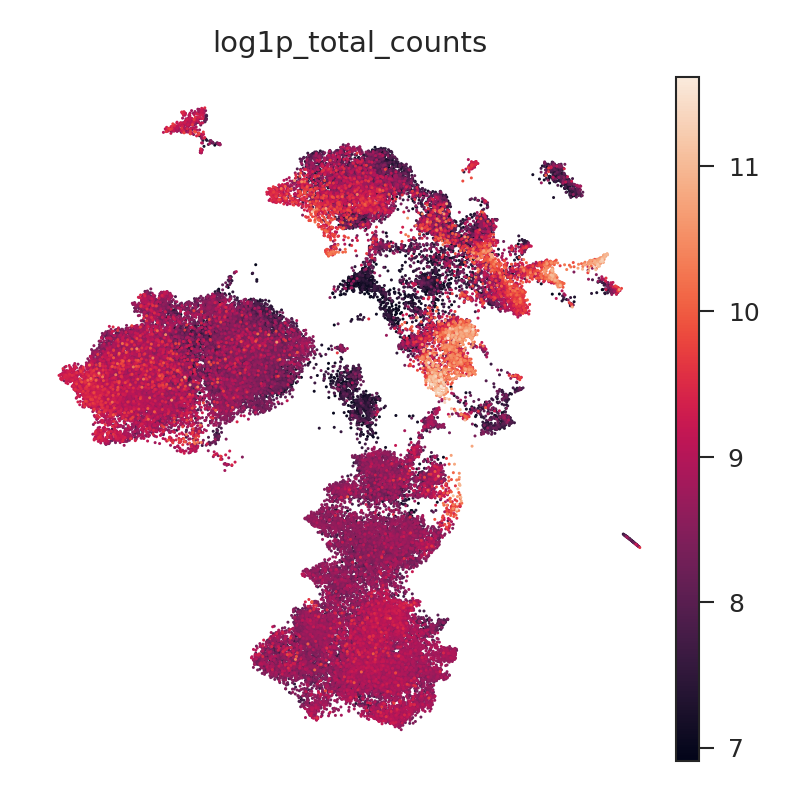

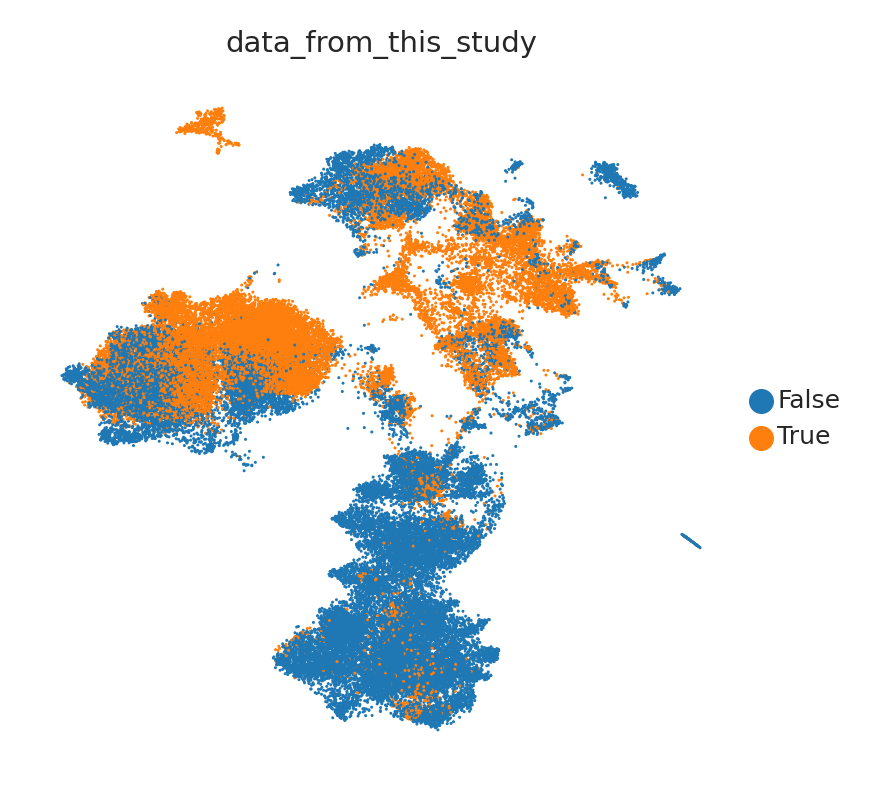

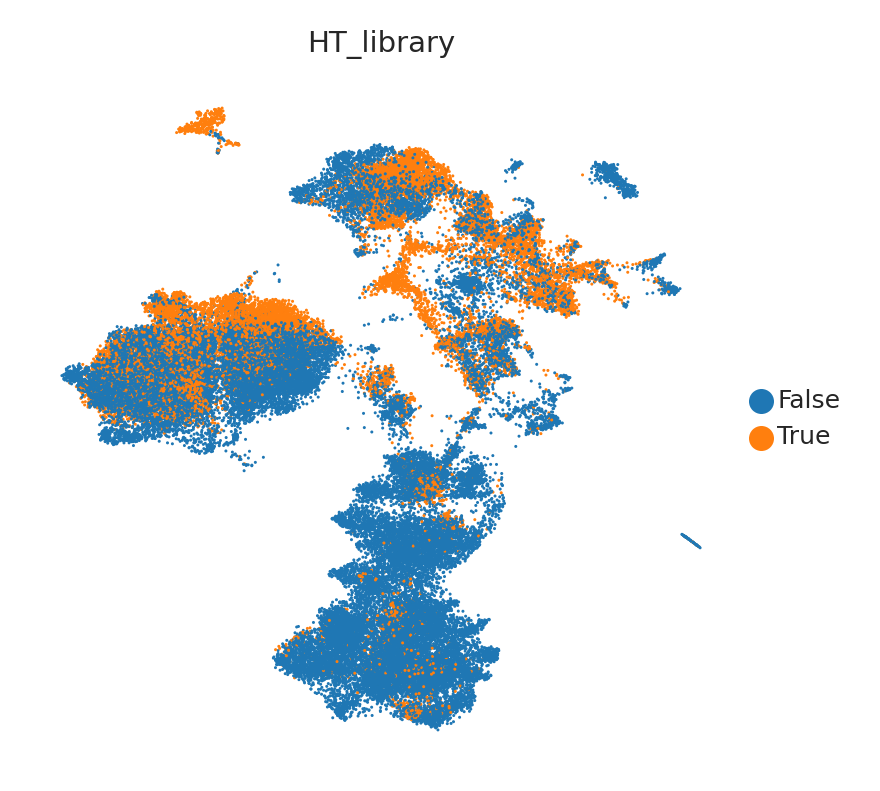

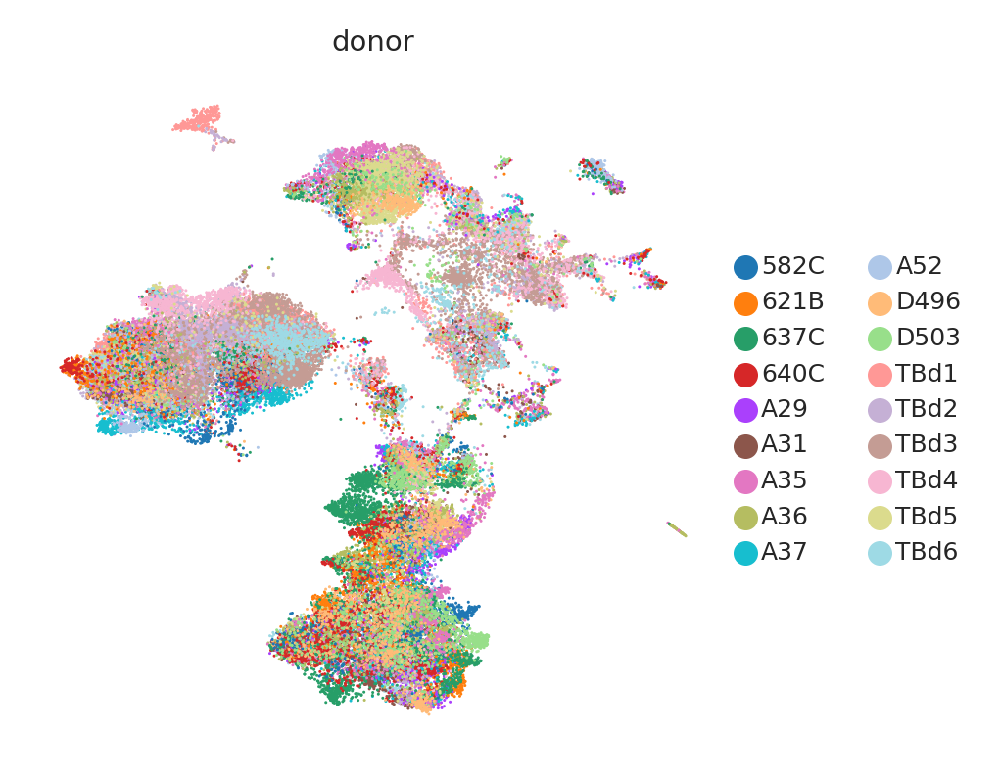

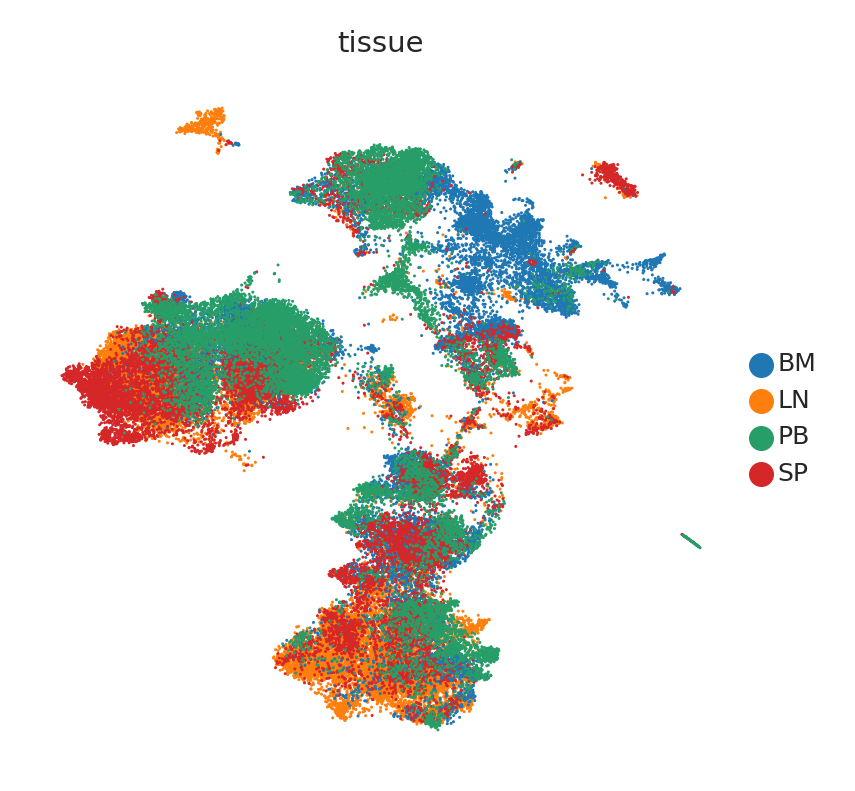

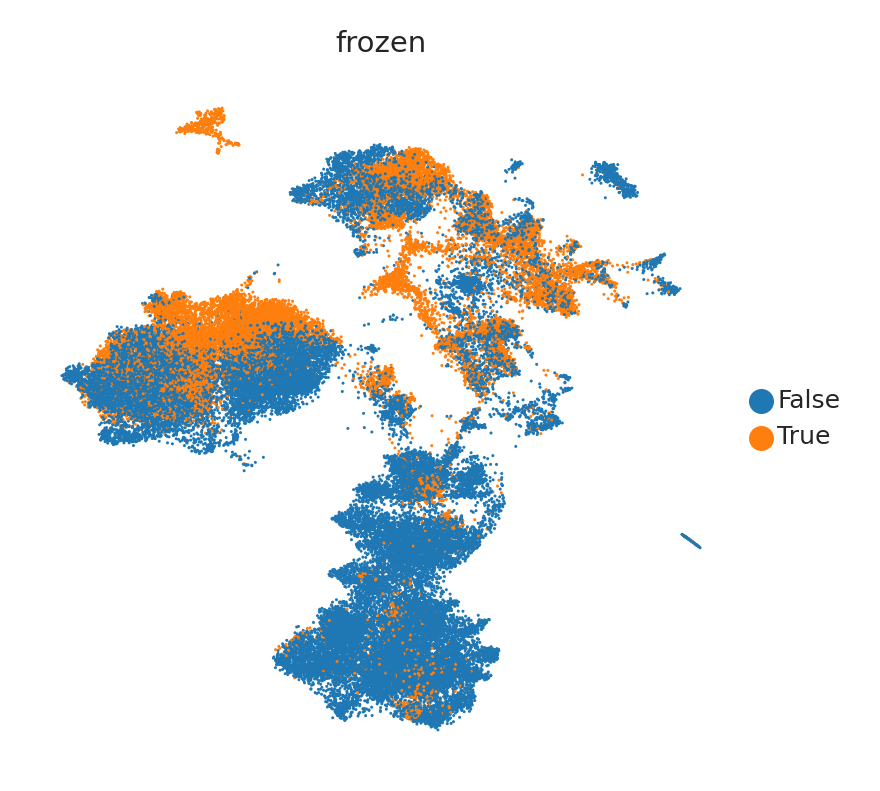

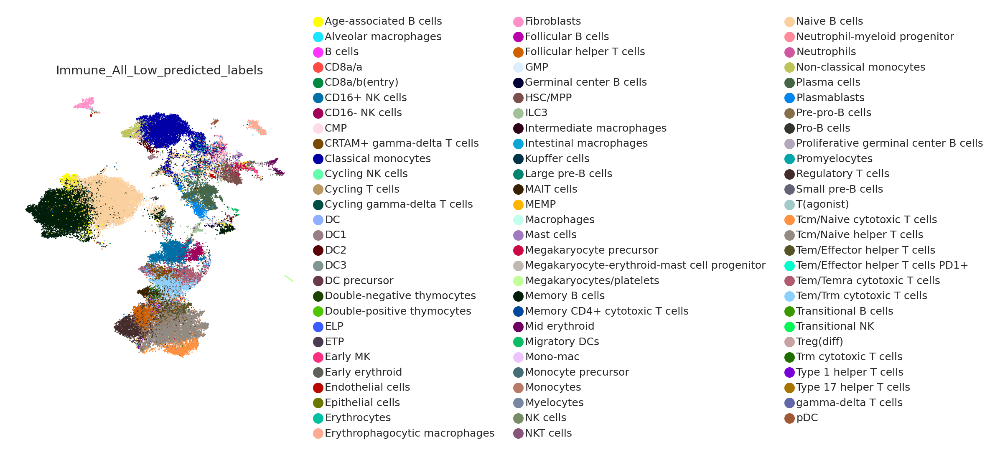

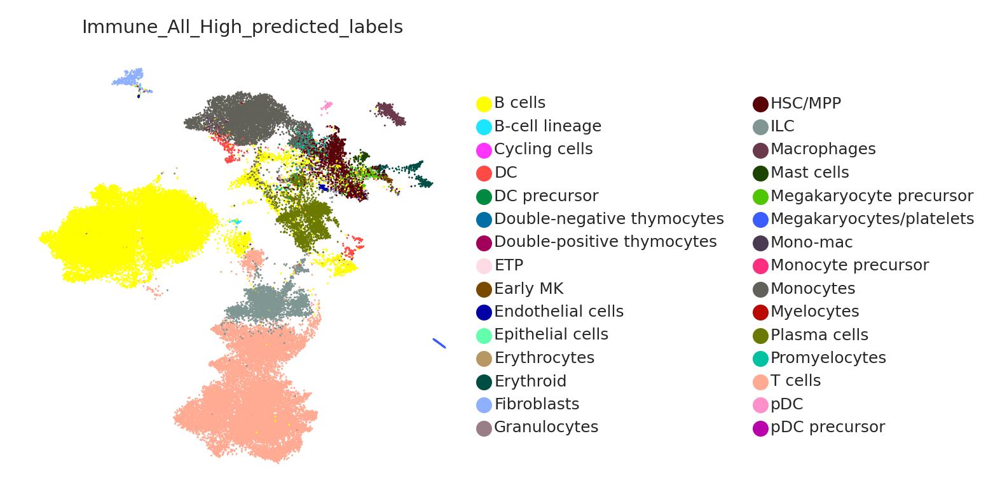

In [9]:
### Umaps using scVI latent space

sc.pp.neighbors(ad, use_rep="X_scVI_all")
sc.tl.umap(ad)

for tvar in technical_variables:
    sc.pl.umap(ad, color=tvar)

In [10]:
ad.obs["is_B_cell"] = ad.obs.Immune_All_Low_predicted_labels.str.contains("B cell|Plasma cells|Plasmablast|B-cell lineage")

In [11]:
ad.obs.groupby('is_B_cell')['Immune_All_Low_predicted_labels'].value_counts()

is_B_cell  Immune_All_Low_predicted_labels
False      Tcm/Naive helper T cells           6721
           Classical monocytes                5383
           Tem/Trm cytotoxic T cells          2231
           CD16+ NK cells                     2215
           Regulatory T cells                 1979
                                              ... 
True       Trm cytotoxic T cells                 0
           Type 1 helper T cells                 0
           Type 17 helper T cells                0
           gamma-delta T cells                   0
           pDC                                   0
Name: count, Length: 166, dtype: int64

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_scatter(ad, technical_variables, x_index, y_index, hue_col, legend_title='Labels', markerscale=5):
    """
    Creates a DataFrame from an AnnData object and technical variables, then plots a scatter plot for the specified indices of x and y columns.
    
    Parameters:
    - ad: AnnData object containing the data.
    - technical_variables: List of strings, names of the technical variables to include in the DataFrame.
    - x_index: Integer, index of the column to be used for x-axis values.
    - y_index: Integer, index of the column to be used for y-axis values.
    - hue_col: String, name of the column to be used for coloring the points.
    - legend_title: String, title for the legend.
    - markerscale: Float, scale factor for the markers in the legend.
    """
    # Create DataFrame manually
    df = ad.obs[technical_variables].copy().reset_index()  # Ensure you copy to avoid SettingWithCopyWarning
    df[f'X_scVI_all_{x_index}'] = ad.obsm['X_scVI_all'][:, x_index]
    df[f'X_scVI_all_{y_index}'] = ad.obsm['X_scVI_all'][:, y_index]

    # Plotting
    x_col = f'X_scVI_all_{x_index}'
    y_col = f'X_scVI_all_{y_index}'
    ax = sns.scatterplot(data=df, x=x_col, y=y_col, hue=hue_col, s=2, alpha=0.6, palette='tab10')
    legend = ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), title=legend_title, markerscale=markerscale)
    plt.show()

# Example usage:
technical_variables = ["is_B_cell", "Immune_All_High_predicted_labels", 'n_genes', 'log1p_total_counts', 'data_from_this_study', 'HT_library', 'donor', 'tissue', 'frozen']


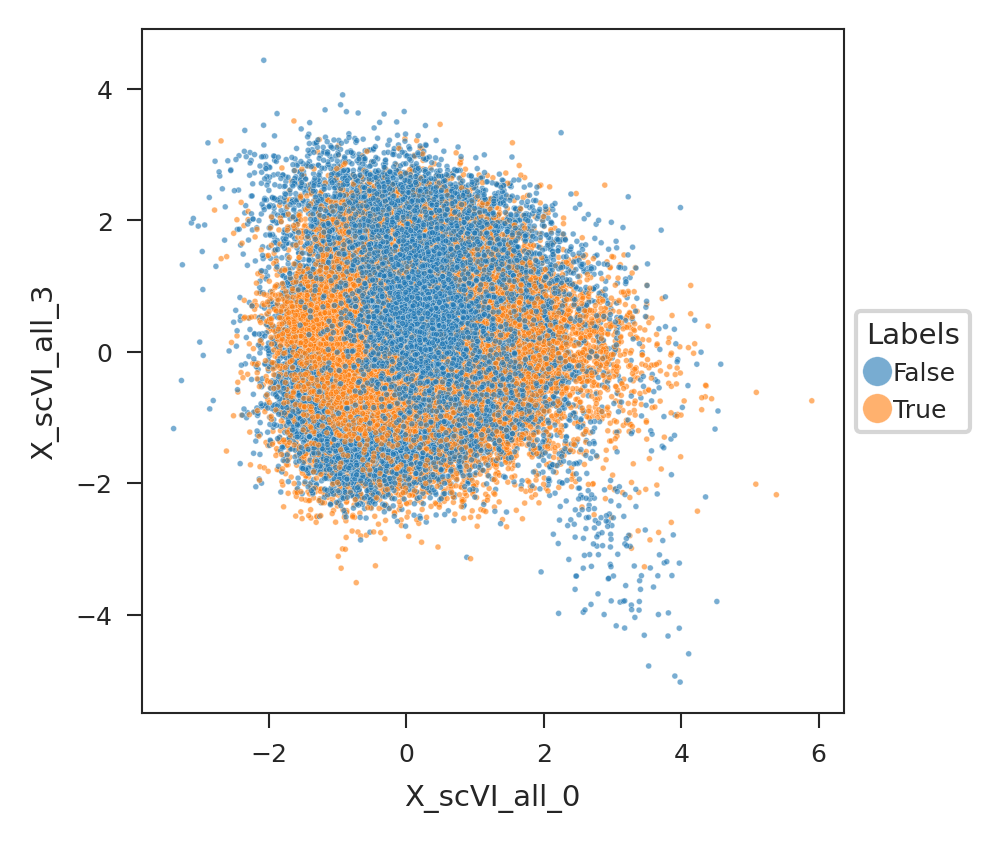

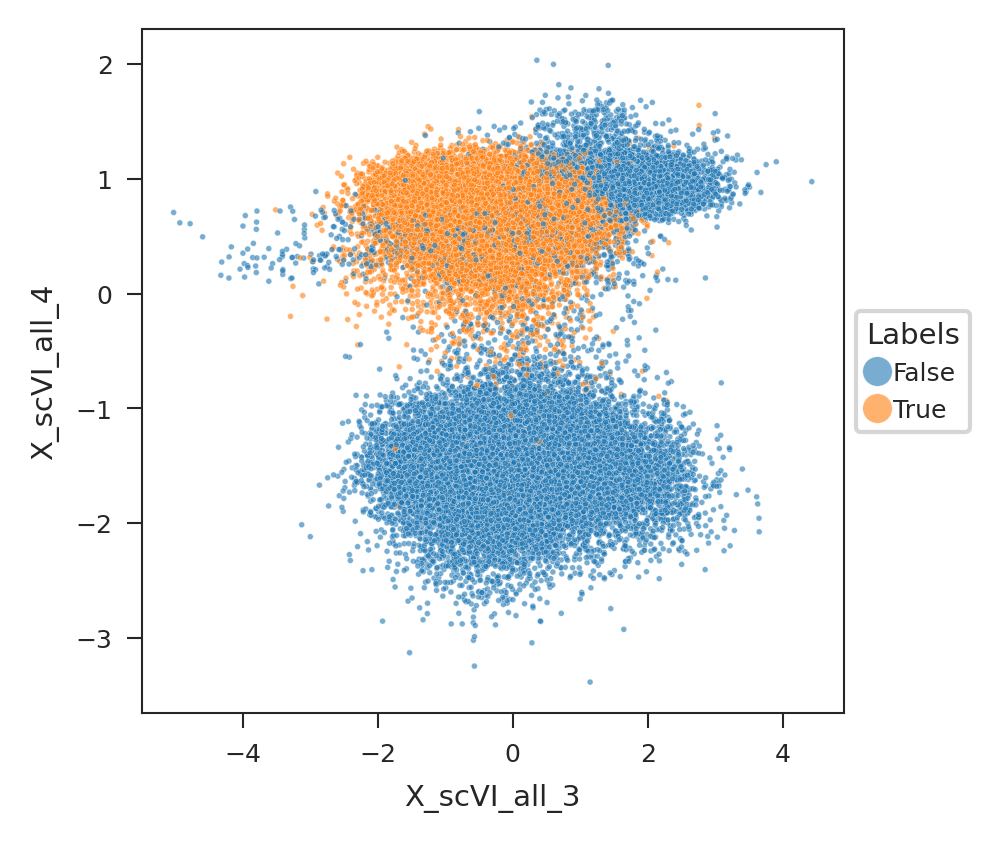

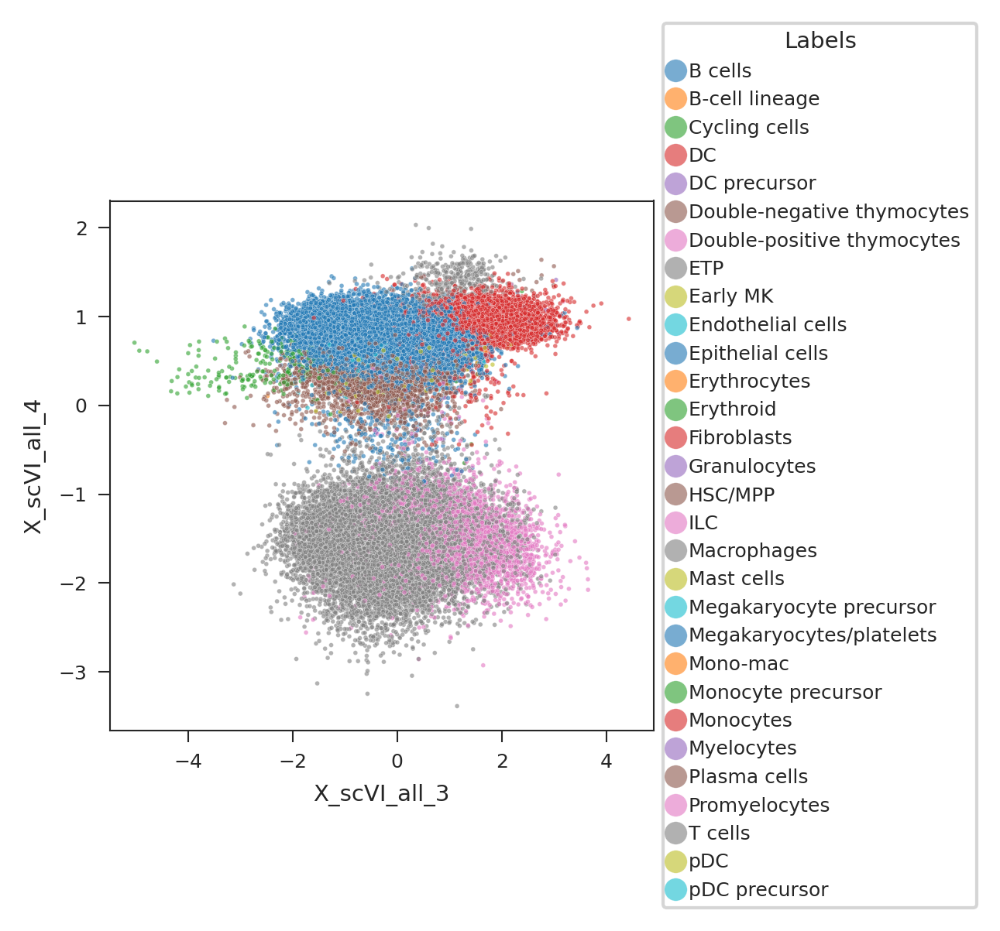

In [13]:
plot_scatter(ad, technical_variables, 0, 3, 'data_from_this_study')

plot_scatter(ad, technical_variables, 3, 4, 'is_B_cell')

plot_scatter(ad, technical_variables, 3, 4, 'Immune_All_High_predicted_labels')


## TBd3 has quite a bit of technical replication

In [14]:
TBd3 = adata[adata.obs.sample_uid.str.contains("TBd3")]
TBd3 = TBd3.to_memory()
# Ensure 'data' is a copy and not a view

In [15]:
# Add Categorical Columns of Interest
#TBd3.obs['frozen'] = TBd3.obs.sample_uid.str.contains('frozen')



data = TBd3.obs.copy()
just_B_cells = False
if just_B_cells:
    data = data[data.probable_hq_single_b_cell == "True"]
# Create the 'celltype' column by copying 'Immune_All_High_predicted_labels'
data['celltype'] = data['Immune_All_High_predicted_labels']

data = (
    data.groupby(["donor", "tissue", "frozen", "sample_uid"], observed=True)
    .celltype.value_counts(normalize=True)
    .rename("fraction")
    .reset_index()
)
# Assuming 'data' is your DataFrame from the previous steps
# Pivot the data
pivot_data = data.pivot_table(index='celltype', columns='sample_uid', values='fraction', fill_value=0)

# Calculate the correlation matrix
correlation_matrix = pivot_data.corr(method='spearman')  # You can also use 'pearson'

/tmp/ipykernel_36562/3881990839.py:21: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_data = data.pivot_table(index='celltype', columns='sample_uid', values='fraction', fill_value=0)


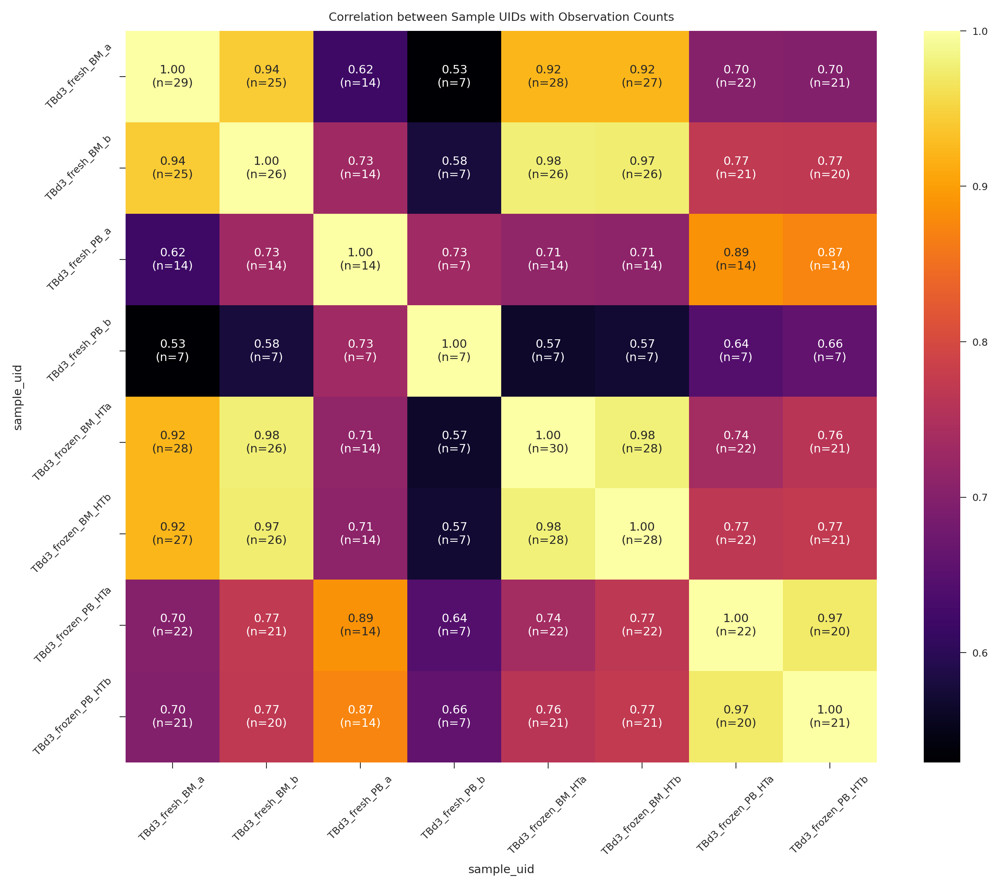

In [16]:


# Calculate the number of observations for each pair
def calculate_obs_counts(pivot_data):
    counts = np.zeros((pivot_data.shape[1], pivot_data.shape[1]), dtype=int)
    for i in range(pivot_data.shape[1]):
        for j in range(pivot_data.shape[1]):
            valid_data_i = pivot_data.iloc[:, i] > 0
            valid_data_j = pivot_data.iloc[:, j] > 0
            counts[i, j] = np.sum(valid_data_i & valid_data_j)
    return counts

obs_counts = calculate_obs_counts(pivot_data)

# Plot the heatmap with annotations
plt.figure(figsize=(10, 8))
ax = sns.heatmap(correlation_matrix, annot=True, cmap='inferno', fmt=".2f")

# Add observation counts as annotations
for i in range(obs_counts.shape[0]):
    for j in range(obs_counts.shape[1]):
        text = ax.texts[i * obs_counts.shape[1] + j]
        text.set_text(f"{text.get_text()}\n(n={obs_counts[i, j]})")

plt.title('Correlation between Sample UIDs with Observation Counts')
plt.xticks(rotation=45)
plt.yticks(rotation=45)
plt.show()

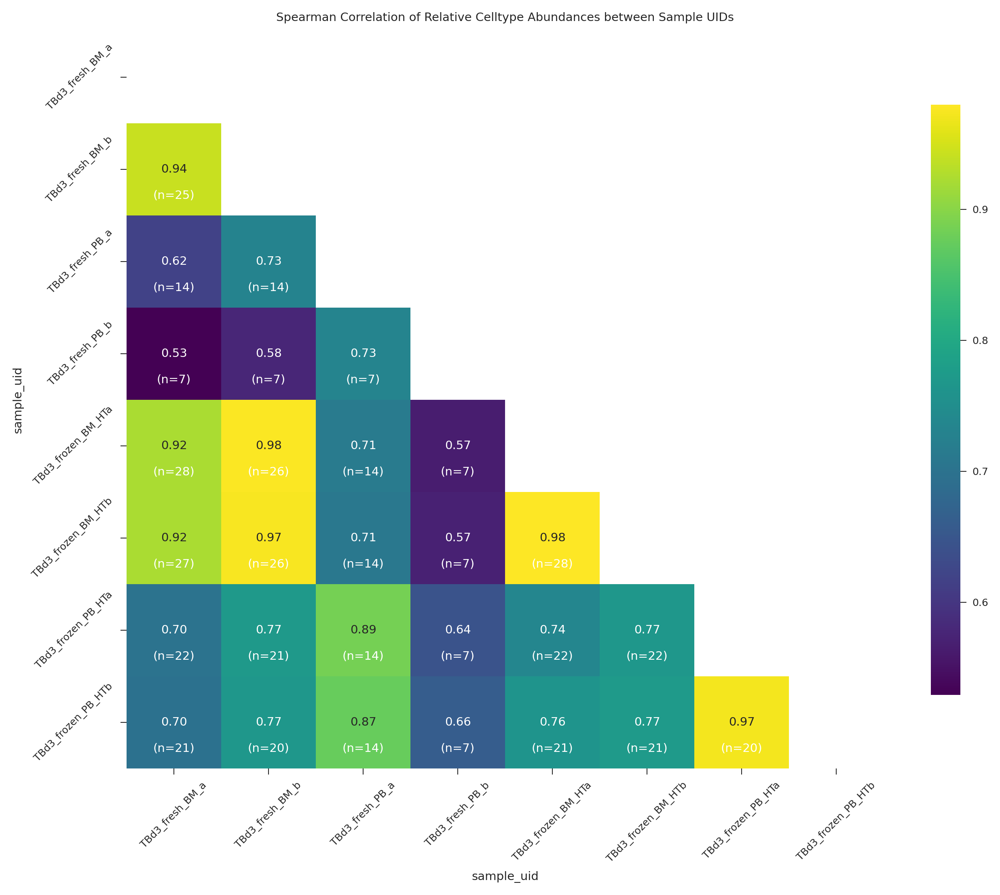

In [17]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'pivot_data' and 'calculate_obs_counts' are already defined as per your previous steps

# Calculate the correlation matrix
correlation_matrix = pivot_data.corr(method='spearman')  # You can also use 'pearson'

# Mask the upper triangle
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Calculate the number of observations for each pair
obs_counts = calculate_obs_counts(pivot_data)

# Plot the heatmap with annotations for the lower triangle only
plt.figure(figsize=(10, 8))
ax = sns.heatmap(correlation_matrix, mask=mask, annot=True, cmap='viridis', fmt=".2f", cbar_kws={'shrink': .8})

# Add observation counts as annotations
annot_kws = {"textcoords": "offset points", "xytext": (0,10), "ha": 'center'}
for i in range(obs_counts.shape[0]):
    for j in range(i + 1):  # Only handle lower triangle
        # Calculate the position for the annotation manually
        if not mask[i, j]:  # Only annotate if the mask is False
            value = correlation_matrix.iloc[i, j]
            obs = obs_counts[i, j]
            # Set the annotation text
            text = f"(n={obs})"
            # Place the text in the correct position
            ax.annotate(text, xy=(j+0.5, i+1), color="white", **annot_kws)

plt.title('Spearman Correlation of Relative Celltype Abundances between Sample UIDs')
plt.xticks(rotation=45)
plt.yticks(rotation=45)
plt.show()

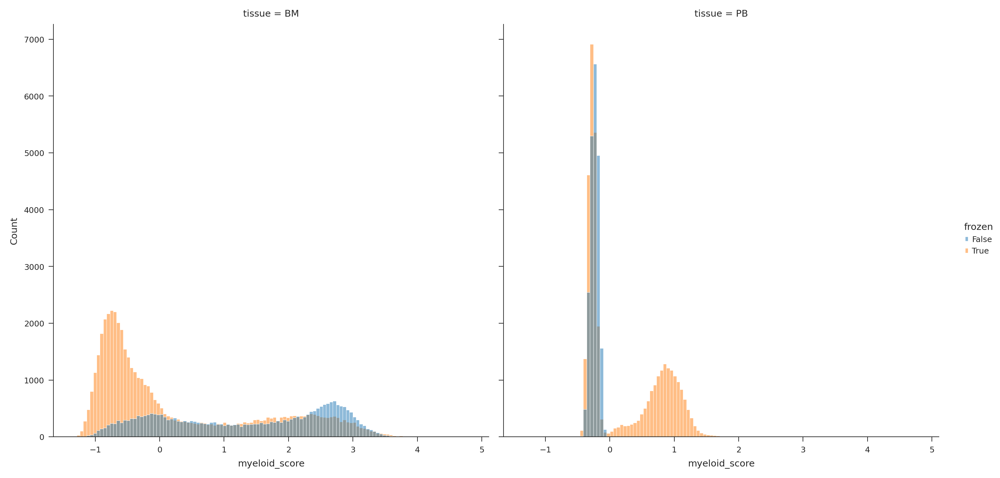

In [18]:
sns.displot(data = TBd3.obs, x = 'myeloid_score', hue = 'frozen', col = 'tissue')

In [19]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd

# Assuming 'data' is your DataFrame and it contains a 'celltype' column where B cells are identified
# Filter data for B cells
b_cell_data = data[data['celltype'] == 'Plasma cells']

# filter zeros for unobserved groups
b_cell_data = b_cell_data[b_cell_data['fraction'] > 0]

# One-Way ANOVA for each predictor
# Example for a predictor 'donor'
model = ols('fraction ~ C(frozen)', data=b_cell_data).fit()
anova_result = sm.stats.anova_lm(model, typ=2)
print(anova_result)

# Multi-Way ANOVA including interaction between 'donor' and 'tissue'
model_interaction = ols('fraction ~ C(frozen) * C(tissue)', data=b_cell_data).fit()
anova_interaction_result = sm.stats.anova_lm(model_interaction, typ=2)
print(anova_interaction_result)

# Post-Hoc Test if ANOVA is significant
if anova_result['PR(>F)'].iloc[0] < 0.05:  # Check p-value for significance
    print("\n\nSignificant differences found, performing Tukey's HSD...")
    tukey = pairwise_tukeyhsd(endog=b_cell_data['fraction'], groups=b_cell_data['donor'], alpha=0.05)
    print("\n",tukey)

    # Plotting the results if needed
    tukey.plot_simultaneous()  # Only if Tukey's test was performed
    plt.show()

             sum_sq   df         F    PR(>F)
C(frozen)  0.016570  1.0  0.673664  0.443157
Residual   0.147578  6.0       NaN       NaN
                       sum_sq   df         F    PR(>F)
C(frozen)            0.016570  1.0  1.268359  0.323069
C(tissue)            0.078809  1.0  6.032631  0.069981
C(frozen):C(tissue)  0.016513  1.0  1.264030  0.323794
Residual             0.052255  4.0       NaN       NaN


In [20]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd

# Assuming 'data' is your DataFrame and it contains a 'celltype' column where B cells are identified
# Filter data for B cells
b_cell_data = data[data['celltype'] == 'Plasma cells']

# filter zeros for unobserved groups
b_cell_data = b_cell_data[b_cell_data['fraction'] > 0]

# One-Way ANOVA for each predictor
# Example for a predictor 'frozen'
model = ols('fraction ~ C(frozen)', data=b_cell_data).fit()
anova_result = sm.stats.anova_lm(model, typ=2)
print("One-Way ANOVA Results:")
print(anova_result)
print("\n")  # Adding a newline for better separation

# Multi-Way ANOVA including interaction between 'frozen' and 'tissue'
model_interaction = ols('fraction ~ C(frozen) * C(tissue)', data=b_cell_data).fit()
anova_interaction_result = sm.stats.anova_lm(model_interaction, typ=2)
print("Multi-Way ANOVA Results:")
print(anova_interaction_result)
print("\n")  # Adding a newline for better separation

# Post-Hoc Test if ANOVA is significant
if anova_result['PR(>F)'].iloc[0] < 0.05:  # Check p-value for significance
    print("Significant differences found, performing Tukey's HSD...")
    tukey = pairwise_tukeyhsd(endog=b_cell_data['fraction'], groups=b_cell_data['donor'], alpha=0.05)
    print("Tukey's HSD Test Results:")
    print(tukey)
    print("\n")  # Adding a newline for better separation

    # Plotting the results if needed
    tukey.plot_simultaneous()
    plt.show()

One-Way ANOVA Results:
             sum_sq   df         F    PR(>F)
C(frozen)  0.016570  1.0  0.673664  0.443157
Residual   0.147578  6.0       NaN       NaN


Multi-Way ANOVA Results:
                       sum_sq   df         F    PR(>F)
C(frozen)            0.016570  1.0  1.268359  0.323069
C(tissue)            0.078809  1.0  6.032631  0.069981
C(frozen):C(tissue)  0.016513  1.0  1.264030  0.323794
Residual             0.052255  4.0       NaN       NaN


